# Importando módulos python

In [1]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.metrics import accuracy_score, cohen_kappa_score, confusion_matrix, f1_score
from sklearn.feature_selection import VarianceThreshold
from sklearn.impute import SimpleImputer
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree

import missingno as msno
%matplotlib inline

# Definições

In [2]:
SEED=0
np.random.seed(SEED)
random.seed(SEED)

cadeia_preprocessamento = {
    'SVC': [],
    'DT': [],
    'RF': [],
    'KNN': [],
}

def avalia(feats, labels, modelo, leg=['Died','Euthanized', 'Lived'], titulo=''):
    
  labels_pred = modelo.predict(feats)

  accuracy = accuracy_score(labels, labels_pred)
  print('Acurácia: ', accuracy)

  kappa = cohen_kappa_score(labels, labels_pred)
  print('Kappa: ', kappa)

  f1 = f1_score(labels, labels_pred, average='weighted')
  print('F1: ', f1)

  confMatrix = confusion_matrix(labels_pred, labels)

  ax = plt.subplot()
  sns.heatmap(confMatrix, annot=True, fmt=".0f")
  plt.xlabel('Real')
  plt.ylabel('Previsto')
  if titulo:
      plt.title('Matriz de Confusão' + ' ' + titulo)
  else:
      plt.title('Matriz de Confusão')

  # Colocar os nomes
  ax.xaxis.set_ticklabels(leg) 
  ax.yaxis.set_ticklabels(leg)
  plt.show()

def preprocessaSVC(feats):
    for pre in cadeia_preprocessamento['SVC']:
        feats = pre.transform(feats)
    return feats

def preprocessaDT(feats):
    for pre in cadeia_preprocessamento['DT']:
        feats = pre.transform(feats)
    return feats

def preprocessaRF(feats):
    for pre in cadeia_preprocessamento['DT']:
        feats = pre.transform(feats)
    return feats

def preprocessaKNN(feats):
    for pre in cadeia_preprocessamento['KNN']:
        feats = pre.transform(feats)
    return feats

def treinaSVC(feats, labels, seed=SEED):
  model = SVC(max_iter= 10000, random_state=seed)
  model.fit(feats, labels)
  return model

def treinaDT(feats, labels, seed=SEED):
  model = DecisionTreeClassifier(random_state=seed)
  model.fit(feats, labels)
  return model

def treinaRF(feats, labels, seed=SEED):
  model = RandomForestClassifier(random_state=seed)
  model.fit(feats, labels)
  return model

def treinaKNN(feats, labels, seed=SEED):
  model = KNeighborsClassifier()
  model.fit(feats, labels)
  return model

# Carregando as bases de treino e teste

## Treino

In [3]:
# df_treino = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/horses/horse.csv')
df_treino = pd.read_csv('horse.csv')
df_treino.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 28 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   surgery                299 non-null    object 
 1   age                    299 non-null    object 
 2   hospital_number        299 non-null    int64  
 3   rectal_temp            239 non-null    float64
 4   pulse                  275 non-null    float64
 5   respiratory_rate       241 non-null    float64
 6   temp_of_extremities    243 non-null    object 
 7   peripheral_pulse       230 non-null    object 
 8   mucous_membrane        252 non-null    object 
 9   capillary_refill_time  267 non-null    object 
 10  pain                   244 non-null    object 
 11  peristalsis            255 non-null    object 
 12  abdominal_distention   243 non-null    object 
 13  nasogastric_tube       195 non-null    object 
 14  nasogastric_reflux     193 non-null    object 
 15  nasoga

In [4]:
df_treino.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,...,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,no,adult,530101,38.5,66.0,28.0,cool,reduced,NaN,more_3_sec,...,45.0,8.4,NaN,NaN,died,no,11300,0,0,no
1,yes,adult,534817,39.2,88.0,20.0,NaN,NaN,pale_cyanotic,less_3_sec,...,50.0,85.0,cloudy,2.0,euthanized,no,2208,0,0,no
2,no,adult,530334,38.3,40.0,24.0,normal,normal,pale_pink,less_3_sec,...,33.0,6.7,NaN,NaN,lived,no,0,0,0,yes
3,yes,young,5290409,39.1,164.0,84.0,cold,normal,dark_cyanotic,more_3_sec,...,48.0,7.2,serosanguious,5.3,died,yes,2208,0,0,yes
4,no,adult,530255,37.3,104.0,35.0,NaN,NaN,dark_cyanotic,more_3_sec,...,74.0,7.4,NaN,NaN,died,no,4300,0,0,no


## Teste

In [5]:
# df_teste = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/horses/horseTest.csv')
df_teste = pd.read_csv('horseTest.csv')
df_teste.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89 entries, 0 to 88
Data columns (total 28 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   surgery                89 non-null     object 
 1   age                    89 non-null     object 
 2   hospital_number        89 non-null     int64  
 3   rectal_temp            73 non-null     float64
 4   pulse                  84 non-null     float64
 5   respiratory_rate       73 non-null     float64
 6   temp_of_extremities    76 non-null     object 
 7   peripheral_pulse       70 non-null     object 
 8   mucous_membrane        79 non-null     object 
 9   capillary_refill_time  85 non-null     object 
 10  pain                   77 non-null     object 
 11  peristalsis            79 non-null     object 
 12  abdominal_distention   77 non-null     object 
 13  nasogastric_tube       66 non-null     object 
 14  nasogastric_reflux     61 non-null     object 
 15  nasogast

In [6]:
df_teste.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,...,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,no,adult,1,37.3,104.0,35.0,NaN,NaN,dark_cyanotic,more_3_sec,...,74.0,7.4,NaN,NaN,died,no,4300,0,0,no
1,no,adult,2,39.1,72.0,52.0,warm,NaN,bright_pink,less_3_sec,...,50.0,7.8,NaN,NaN,lived,yes,2111,0,0,no
2,yes,adult,3,37.2,42.0,12.0,warm,normal,normal_pink,less_3_sec,...,NaN,7.0,NaN,NaN,lived,no,4124,0,0,no
3,no,young,4,38.0,92.0,28.0,normal,normal,bright_pink,less_3_sec,...,37.0,6.1,clear,NaN,died,no,0,0,0,yes
4,yes,adult,5,37.6,64.0,21.0,normal,normal,bright_pink,less_3_sec,...,40.0,7.0,clear,NaN,lived,yes,4205,0,0,yes


# Remover atributos desenessários segundo dicionário de dados

In [7]:
df_treino = df_treino.drop(columns=['cp_data', 'hospital_number'])
df_treino.head()

,surgery,age,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,...,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3
0,no,adult,38.5,66.0,28.0,cool,reduced,NaN,more_3_sec,extreme_pain,...,distend_large,45.0,8.4,NaN,NaN,died,no,11300,0,0
1,yes,adult,39.2,88.0,20.0,NaN,NaN,pale_cyanotic,less_3_sec,mild_pain,...,other,50.0,85.0,cloudy,2.0,euthanized,no,2208,0,0
2,no,adult,38.3,40.0,24.0,normal,normal,pale_pink,less_3_sec,mild_pain,...,normal,33.0,6.7,NaN,NaN,lived,no,0,0,0
3,yes,young,39.1,164.0,84.0,cold,normal,dark_cyanotic,more_3_sec,depressed,...,NaN,48.0,7.2,serosanguious,5.3,died,yes,2208,0,0
4,no,adult,37.3,104.0,35.0,NaN,NaN,dark_cyanotic,more_3_sec,NaN,...,NaN,74.0,7.4,NaN,NaN,died,no,4300,0,0


In [8]:
df_teste = df_teste.drop(columns=['cp_data', 'hospital_number'])
df_teste.head()

,surgery,age,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,...,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3
0,no,adult,37.3,104.0,35.0,NaN,NaN,dark_cyanotic,more_3_sec,NaN,...,NaN,74.0,7.4,NaN,NaN,died,no,4300,0,0
1,no,adult,39.1,72.0,52.0,warm,NaN,bright_pink,less_3_sec,depressed,...,distend_small,50.0,7.8,NaN,NaN,lived,yes,2111,0,0
2,yes,adult,37.2,42.0,12.0,warm,normal,normal_pink,less_3_sec,mild_pain,...,distend_large,NaN,7.0,NaN,NaN,lived,no,4124,0,0
3,no,young,38.0,92.0,28.0,normal,normal,bright_pink,less_3_sec,alert,...,normal,37.0,6.1,clear,NaN,died,no,0,0,0
4,yes,adult,37.6,64.0,21.0,normal,normal,bright_pink,less_3_sec,depressed,...,distend_large,40.0,7.0,clear,NaN,lived,yes,4205,0,0


# Frequência dos valores dos atributos

In [9]:
for attr in df_treino.columns:
    print(df_treino[attr].value_counts())
    print()

yes    180
no     119
Name: surgery, dtype: int64

adult    275
young     24
Name: age, dtype: int64

38.0    25
38.5    19
38.3    18
37.8    17
38.2    16
37.5    12
38.1    12
38.6    12
38.4    11
37.6     7
38.7     7
37.9     7
37.7     7
37.2     7
37.3     6
38.8     6
39.2     5
39.3     4
38.9     4
39.5     4
39.0     4
37.4     3
37.1     3
39.4     3
40.3     2
37.0     2
39.1     2
36.5     2
39.9     1
36.4     1
40.8     1
35.4     1
36.0     1
39.7     1
39.6     1
40.0     1
36.9     1
36.6     1
36.8     1
36.1     1
Name: rectal_temp, dtype: int64

48.0     27
60.0     25
40.0     18
88.0     12
52.0     12
44.0     11
72.0     11
100.0    11
120.0    10
42.0     10
96.0      8
84.0      8
80.0      8
64.0      8
56.0      7
54.0      7
50.0      6
66.0      6
104.0     5
68.0      5
70.0      4
76.0      4
92.0      4
86.0      3
78.0      3
36.0      3
108.0     3
90.0      3
112.0     3
124.0     2
130.0     2
114.0     2
45.0      2
140.0     2
30.0      2
150.0

# Label, variáveis categóricas e numéricas

In [10]:
categoricas = df_treino.columns[df_treino.dtypes==object].tolist()
numericas = df_treino.columns[df_treino.dtypes!=object].tolist()
label = 'outcome'
categoricas.remove(label)

# Ajuste dos dados

In [11]:
labels_treino = df_treino[label] # y_treino
feats_treino = df_treino.drop(columns=label) # X_treino

labels_treino.shape, feats_treino.shape

((299,), (299, 25))

In [12]:
labels_teste = df_teste[label] # y_teste
feats_teste = df_teste.drop(columns=label) # X_teste

labels_teste.shape, feats_teste.shape

((89,), (89, 25))

# Análise dos dados

## Shape

In [13]:
df_treino.shape

(299, 26)

In [14]:
df_teste.shape

(89, 26)

## Stats

In [15]:
df_treino.describe()

,rectal_temp,pulse,respiratory_rate,nasogastric_reflux_ph,packed_cell_volume,total_protein,abdomo_protein,lesion_1,lesion_2,lesion_3
count,239.000000,275.000000,241.000000,53.000000,270.000000,266.000000,101.000000,299.000000,299.000000,299.000000
mean,38.168619,72.000000,30.460581,4.707547,46.307407,24.274436,3.039604,3659.709030,90.528428,7.387960
std,0.733744,28.646219,17.666102,1.982311,10.436743,27.364194,1.967947,5408.472421,650.637139,127.749768
min,35.400000,30.000000,8.000000,1.000000,23.000000,3.300000,0.100000,0.000000,0.000000,0.000000
25%,37.800000,48.000000,18.000000,3.000000,38.000000,6.500000,2.000000,2111.500000,0.000000,0.000000
50%,38.200000,64.000000,25.000000,5.000000,45.000000,7.500000,2.300000,2322.000000,0.000000,0.000000
75%,38.500000,88.000000,36.000000,6.500000,52.000000,56.750000,3.900000,3209.000000,0.000000,0.000000
max,40.800000,184.000000,96.000000,7.500000,75.000000,89.000000,10.100000,41110.000000,7111.000000,2209.000000


> 299 linhas na base de treino mas muitos atributos apresentam missing

In [16]:
df_teste.describe()

,rectal_temp,pulse,respiratory_rate,nasogastric_reflux_ph,packed_cell_volume,total_protein,abdomo_protein,lesion_1,lesion_2,lesion_3
count,73.000000,84.000000,73.000000,14.000000,82.000000,79.000000,29.000000,89.000000,89.000000,89.000000
mean,38.175342,74.797619,34.232877,5.028571,45.621951,22.930380,2.782759,4582.415730,218.483146,24.820225
std,0.808768,31.099831,19.158346,1.728240,9.196940,26.512955,2.251042,7088.406982,1082.038807,234.153532
min,36.000000,36.000000,9.000000,2.000000,31.000000,3.300000,1.000000,0.000000,0.000000,0.000000
25%,37.800000,52.500000,20.000000,4.125000,39.000000,6.500000,1.300000,2111.000000,0.000000,0.000000
50%,38.100000,65.000000,30.000000,5.150000,44.000000,7.300000,2.000000,3111.000000,0.000000,0.000000
75%,38.600000,93.000000,42.000000,6.625000,50.000000,54.500000,3.200000,4206.000000,0.000000,0.000000
max,40.800000,184.000000,90.000000,7.200000,74.000000,89.000000,10.100000,41110.000000,7111.000000,2209.000000


> **89 linhas na base de treino mas muitos atributos apresentam missing**

## Missing values

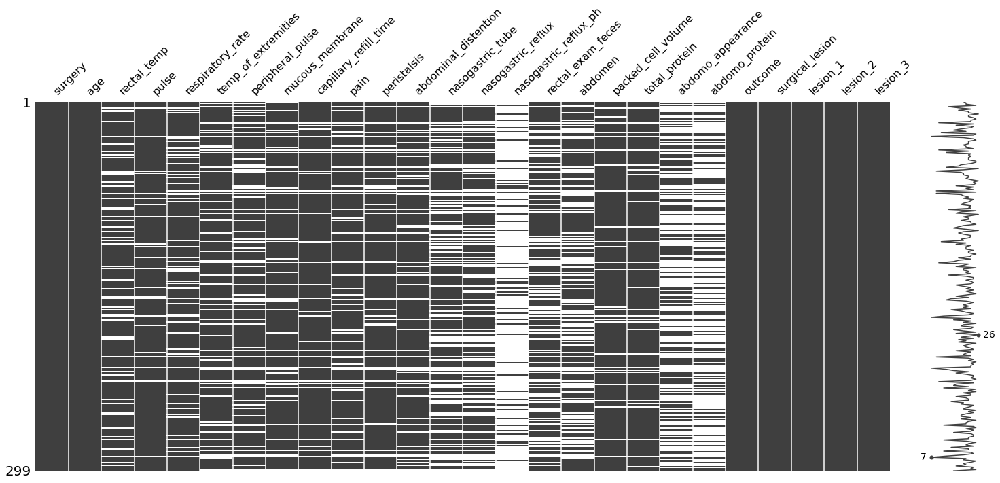

In [17]:
msno.matrix(df_treino);

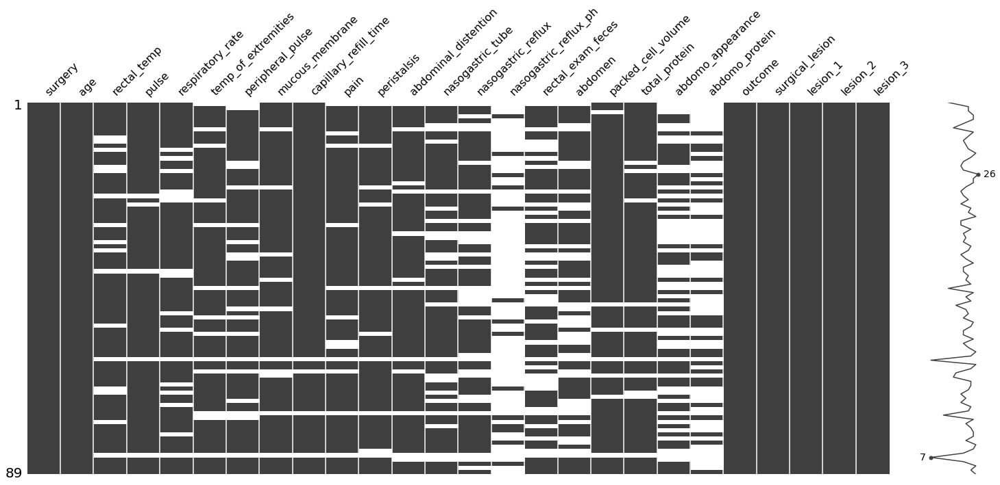

In [18]:
msno.matrix(df_teste);

> **Como pode ser observado, tanto em treino como em teste, muitos atributos apresentam missing values, evidenciados pelos
> espaços em branco nos dois gráficos acima.
> Especialmente, *nasogastric_reflux_ph*, *abdomo_appearance* e *abdomo_protein*, parecem ser os atributos mais afetados
> por missing values e candidatos a descarte.**

## Pandas profiling

In [19]:
# !pip install --upgrade pandas_profiling
ProfileReport(df_treino)

Summarize dataset:   0%|          | 0/39 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## *Outliers*

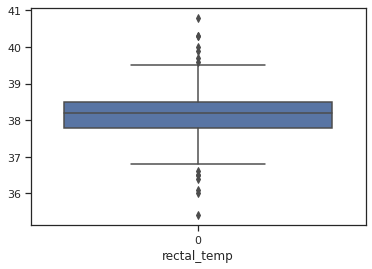

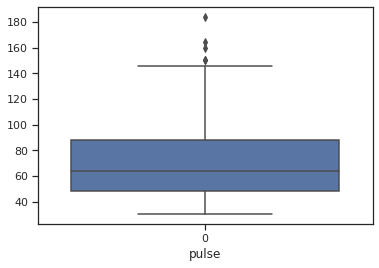

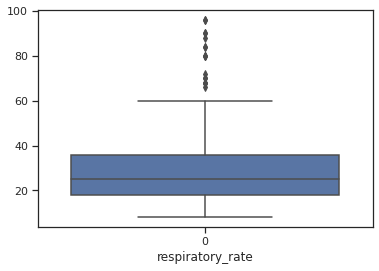

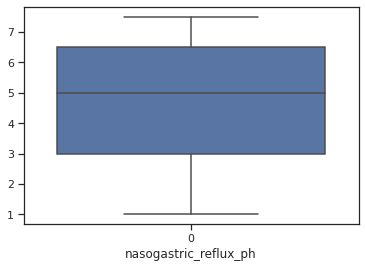

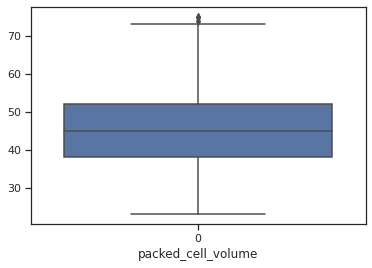

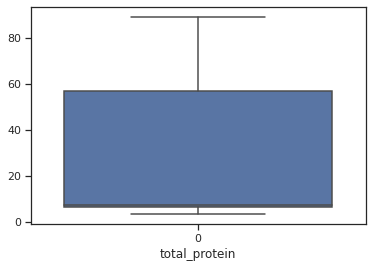

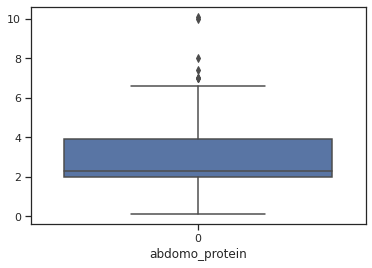

In [20]:
sns.set_theme(style="ticks")
for c in numericas:
    if 'lesion' not in c:
        sns.boxplot(data=df_treino[c])
        ax = plt.gca()
        ax.set_xlabel(c)
        plt.show()

## Relação entre atributos

<Figure size 7200x1800 with 0 Axes>

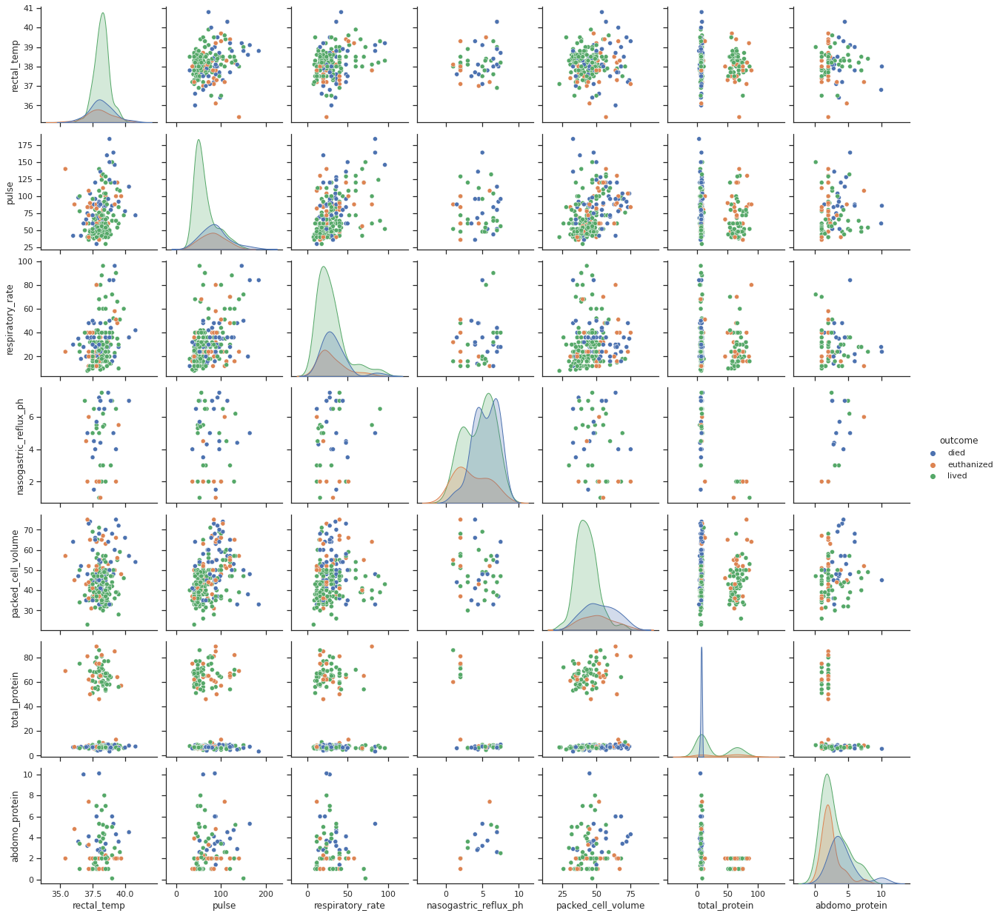

In [21]:
sns.set_theme(style="ticks")
plt.figure(figsize=(100,25));
# retirando lesion_1, lesion_2 e lesion_3 da análise por possuírem muitos registros iguais a zero
sns.pairplot(df_treino.drop(columns=['lesion_1','lesion_2','lesion_3']), hue="outcome");

## Balanceamento

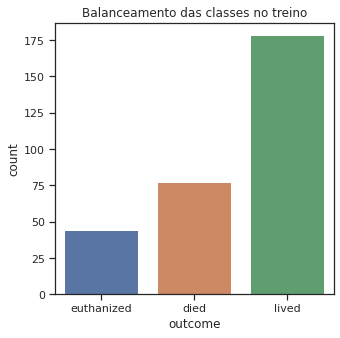

lived: 59.53%, euthanized: 14.72%, died: 25.75%


In [22]:
plt.figure(figsize=(5,5))
sns.countplot(data=pd.DataFrame(labels_treino), x=label, order=['euthanized', 'died', 'lived'])
plt.title('Balanceamento das classes no treino')
plt.show();
lived, died, euthanized = labels_treino.value_counts()
soma = sum((lived, euthanized, died))
print(f'lived: {lived/soma*100:.2f}%, euthanized: {euthanized/soma*100:.2f}%, died: {died/soma*100:.2f}%')

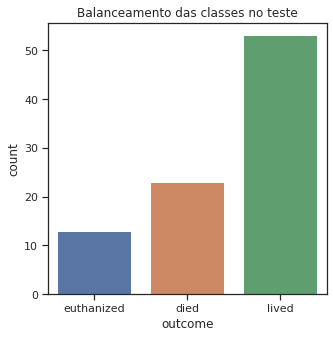

lived: 59.55%, euthanized: 14.61%, died: 25.84%


In [23]:
plt.figure(figsize=(5,5))
sns.countplot(data=pd.DataFrame(labels_teste), x=label, order=['euthanized', 'died', 'lived'])
plt.title('Balanceamento das classes no teste')
plt.show();
lived, died, euthanized = labels_teste.value_counts()
soma = sum((lived, euthanized, died))
print(f'lived: {lived/soma*100:.2f}%, euthanized: {euthanized/soma*100:.2f}%, died: {died/soma*100:.2f}%')

> **Base de teste foi gerada de forma estratificada.**

# Tratamento de missing values

In [24]:
imputers = {}
for attr in feats_treino.columns:
    if feats_treino[attr].isnull().count() > 0:
        if attr in categoricas:
            # se atributo é categórico uso a moda
            imputers[attr] = SimpleImputer(strategy='most_frequent').fit(feats_treino[[attr]])
        else:
            # se numérico, usa a mediana
            imputers[attr] = SimpleImputer(strategy='median').fit(feats_treino[[attr]])

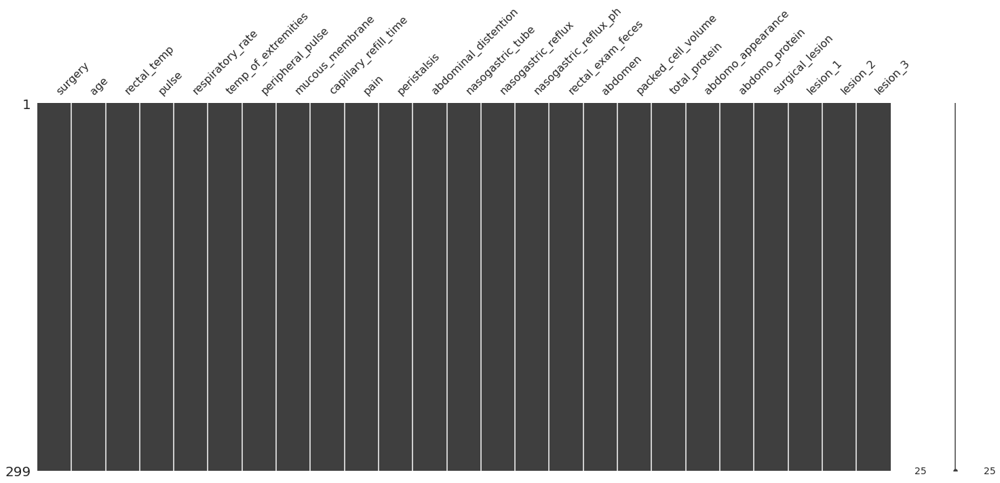

In [25]:
for attr in imputers:
    feats_treino[attr] = imputers[attr].transform(feats_treino[[attr]])

msno.matrix(feats_treino);

<AxesSubplot:>

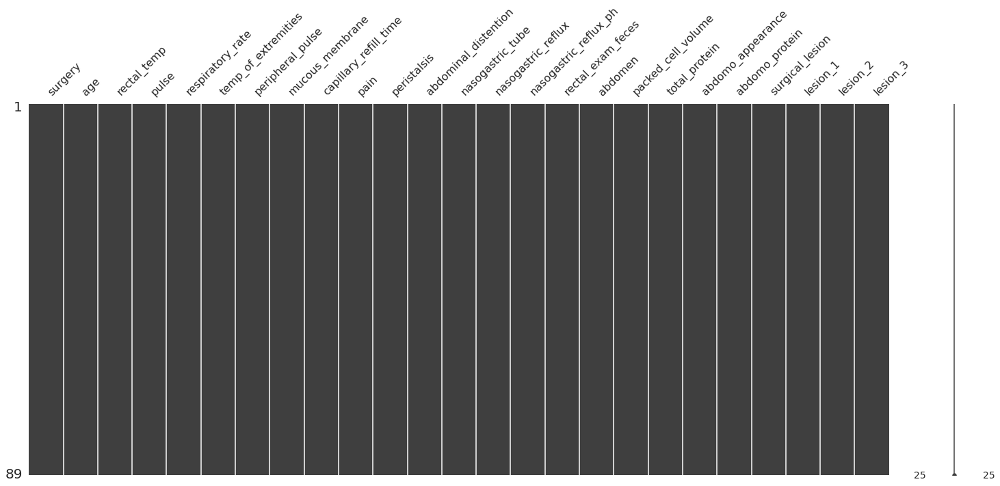

In [26]:
for attr in imputers:
    feats_teste[attr] = imputers[attr].transform(feats_teste[[attr]])

msno.matrix(feats_teste)

# Codificar categóricas em numéricas

In [27]:
encoders = {}
for cat in categoricas:
  encoders[cat] = LabelEncoder().fit(feats_treino[cat])

In [28]:
for cat in categoricas:
    feats_treino[cat] = encoders[cat].transform(feats_treino[cat])
    
feats_treino.head(25)

,surgery,age,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,...,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3
0,0,0,38.5,66.0,28.0,1,3,3,2,2,...,1,0,45.0,8.4,1,2.3,0,11300.0,0.0,0.0
1,1,0,39.2,88.0,20.0,1,2,4,1,3,...,0,4,50.0,85.0,1,2.0,0,2208.0,0.0,0.0
2,0,0,38.3,40.0,24.0,2,2,5,1,3,...,3,3,33.0,6.7,1,2.3,0,0.0,0.0,0.0
3,1,1,39.1,164.0,84.0,0,2,2,2,1,...,1,0,48.0,7.2,2,5.3,1,2208.0,0.0,0.0
4,0,0,37.3,104.0,35.0,1,2,2,2,3,...,0,0,74.0,7.4,1,2.3,0,4300.0,0.0,0.0
5,0,0,38.2,64.0,25.0,3,2,5,1,1,...,1,2,45.0,7.5,1,2.3,0,0.0,0.0,0.0
6,1,0,37.9,48.0,16.0,2,2,3,1,3,...,1,0,37.0,7.0,1,2.3,1,3124.0,0.0,0.0
7,1,0,38.2,60.0,25.0,1,2,3,1,3,...,1,1,44.0,8.3,1,2.3,1,2208.0,0.0,0.0
8,0,0,38.2,80.0,36.0,1,0,5,1,4,...,1,0,38.0,6.2,1,2.3,1,3205.0,0.0,0.0
9,0,1,38.3,90.0,25.0,2,2,3,1,2,...,1,0,40.0,6.2,0,2.2,0,0.0,0.0,0.0


In [29]:
for cat in categoricas:
    feats_teste[cat] = encoders[cat].transform(feats_teste[cat])
    
feats_teste.head()

,surgery,age,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,...,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3
0,0,0,37.3,104.0,35.0,1,2,2,2,3,...,0,0,74.0,7.4,1,2.3,0,4300.0,0.0,0.0
1,0,0,39.1,72.0,52.0,3,2,0,1,1,...,0,1,50.0,7.8,1,2.3,1,2111.0,0.0,0.0
2,1,0,37.2,42.0,12.0,3,2,3,1,3,...,0,0,45.0,7.0,1,2.3,0,4124.0,0.0,0.0
3,0,1,38.0,92.0,28.0,2,2,0,1,0,...,3,3,37.0,6.1,0,2.3,0,0.0,0.0,0.0
4,1,0,37.6,64.0,21.0,2,2,0,1,1,...,2,0,40.0,7.0,0,2.3,1,4205.0,0.0,0.0


In [30]:
zerovar = VarianceThreshold(0.3).fit(feats_treino)
(zerovar.variances_ > 0.3).sum()

20

# Descartar atributos de variância zero

In [31]:
zerovar = VarianceThreshold(0.1).fit(feats_treino)
(zerovar.variances_ > 0.1).sum()

24

In [32]:
feats_treino = feats_treino[feats_treino.columns[zerovar.get_support(indices=True)]]
feats_treino

,surgery,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,...,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3
0,0,38.5,66.0,28.0,1,3,3,2,2,0,...,1,0,45.0,8.4,1,2.3,0,11300.0,0.0,0.0
1,1,39.2,88.0,20.0,1,2,4,1,3,0,...,0,4,50.0,85.0,1,2.0,0,2208.0,0.0,0.0
2,0,38.3,40.0,24.0,2,2,5,1,3,2,...,3,3,33.0,6.7,1,2.3,0,0.0,0.0,0.0
3,1,39.1,164.0,84.0,0,2,2,2,1,0,...,1,0,48.0,7.2,2,5.3,1,2208.0,0.0,0.0
4,0,37.3,104.0,35.0,1,2,2,2,3,2,...,0,0,74.0,7.4,1,2.3,0,4300.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,1,38.2,120.0,70.0,0,2,4,2,1,0,...,0,0,55.0,65.0,1,2.3,0,3205.0,0.0,0.0
295,0,37.2,72.0,24.0,1,1,4,2,4,2,...,0,1,44.0,7.5,2,3.3,1,2208.0,0.0,0.0
296,1,37.5,72.0,30.0,0,3,4,1,4,0,...,1,0,60.0,6.8,1,2.3,1,3205.0,0.0,0.0
297,1,36.5,100.0,24.0,1,3,5,1,3,2,...,0,1,50.0,6.0,2,3.4,1,2208.0,0.0,0.0


In [33]:
feats_teste = feats_teste[feats_teste.columns[zerovar.get_support(indices=True)]]
feats_teste

,surgery,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,...,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3
0,0,37.3,104.0,35.0,1,2,2,2,3,2,...,0,0,74.0,7.4,1,2.3,0,4300.0,0.0,0.0
1,0,39.1,72.0,52.0,3,2,0,1,1,1,...,0,1,50.0,7.8,1,2.3,1,2111.0,0.0,0.0
2,1,37.2,42.0,12.0,3,2,3,1,3,2,...,0,0,45.0,7.0,1,2.3,0,4124.0,0.0,0.0
3,0,38.0,92.0,28.0,2,2,0,1,0,2,...,3,3,37.0,6.1,0,2.3,0,0.0,0.0,0.0
4,1,37.6,64.0,21.0,2,2,0,1,1,2,...,2,0,40.0,7.0,0,2.3,1,4205.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,1,38.2,64.0,25.0,1,2,3,1,3,2,...,0,0,45.0,7.5,1,2.3,1,2124.0,0.0,0.0
85,0,38.6,45.0,16.0,3,2,0,1,0,1,...,3,3,43.0,58.0,1,2.3,0,0.0,0.0,0.0
86,1,38.9,80.0,44.0,1,3,5,1,1,2,...,1,3,54.0,6.5,2,2.3,1,7111.0,0.0,0.0
87,1,37.0,66.0,20.0,2,3,0,1,4,2,...,3,0,35.0,6.9,1,2.3,1,31110.0,0.0,0.0


> **Não há atributos com variância zero para ser descartado**

# Normalização dos dados

In [34]:
normalizer = StandardScaler().fit(feats_treino)
cadeia_preprocessamento['SVC'].append(normalizer)
cadeia_preprocessamento['KNN'].append(normalizer)

# Avaliando SVC

## Sem pré-processamento

Acurácia:  0.6292134831460674
Kappa:  0.10837887067395258
F1:  0.5137635785926142


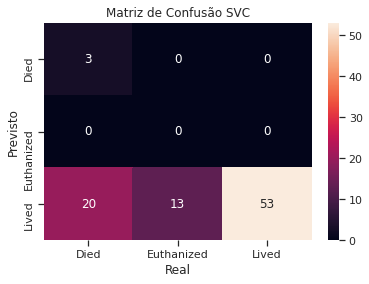

In [35]:
modelo_svc = treinaSVC(feats_treino, labels_treino)
avalia(feats_teste, labels_teste, modelo_svc, titulo='SVC')

## Com pré-processamento

Acurácia:  0.8539325842696629
Kappa:  0.7187651920272241
F1:  0.846508252244503


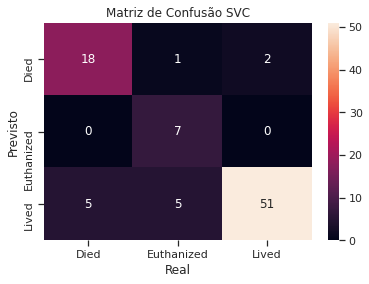

In [36]:
modelo_svc = treinaSVC(preprocessaSVC(feats_treino), labels_treino)
avalia(preprocessaSVC(feats_teste), labels_teste, modelo_svc, titulo='SVC')

# Grid Search - SVC

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Parâmetros do modelo:  {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
Acurácia:  1.0
Kappa:  1.0
F1:  1.0


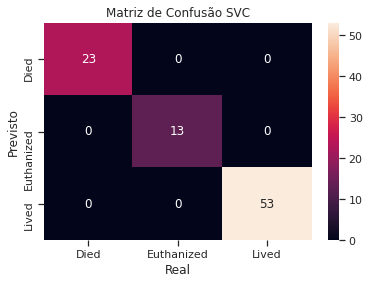

In [37]:
svc_tuned_parameters = [
    {
#         'kernel': ['linear', 'rbf', 'poly'], 
        'kernel': [ 'poly', 'rbf' ], 
        'gamma': [ 1, 0.1, ],
        'C': [ 10, 100, 1000 ],
    }
]

modelo_svc = GridSearchCV(SVC(), svc_tuned_parameters, scoring='f1_micro', n_jobs=4, verbose=2)
modelo_svc.fit(preprocessaSVC(feats_treino), labels_treino)

print('Parâmetros do modelo: ', modelo_svc.best_params_)

avalia(preprocessaSVC(feats_teste), labels_teste, modelo_svc, titulo="SVC")

# Avaliando Decision Tree

Acurácia:  1.0
Kappa:  1.0
F1:  1.0


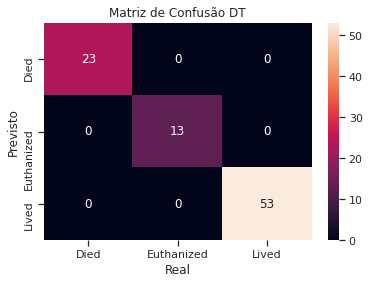

In [38]:
modelo_dt = treinaDT(preprocessaDT(feats_treino), labels_treino)
avalia(preprocessaDT(feats_teste), labels_teste, modelo_dt, titulo='DT')

In [39]:
fig, ax = plt.subplots(figsize=(200, 100))
tree.plot_tree(modelo_dt, class_names=['Died', 'Euthanized', 'Lived'], filled=True, rounded=True);

# Avaliando Random Forest

Acurácia:  1.0
Kappa:  1.0
F1:  1.0


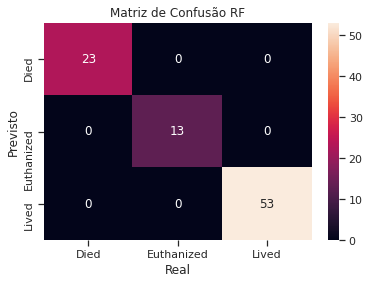

In [40]:
modelo_rf = treinaRF(preprocessaRF(feats_treino), labels_treino)
avalia(preprocessaRF(feats_teste), labels_teste, modelo_rf, titulo='RF')

# Avaliando Classificador KNN

Acurácia:  0.7191011235955056
Kappa:  0.4386982845610494
F1:  0.6922905180460709


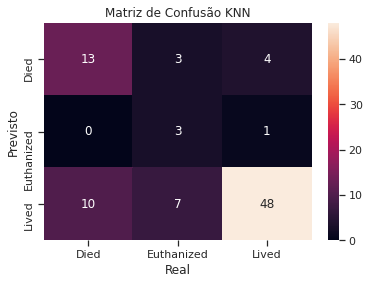

In [41]:
modelo_knn = treinaKNN(preprocessaKNN(feats_treino), labels_treino)
avalia(preprocessaKNN(feats_teste), labels_teste, modelo_knn, titulo='KNN')

# Grid Search - KNN

Parâmetros do modelo:  {'metric': 'manhattan', 'n_neighbors': 7, 'weights': 'distance'}
Acurácia:  1.0
Kappa:  1.0
F1:  1.0


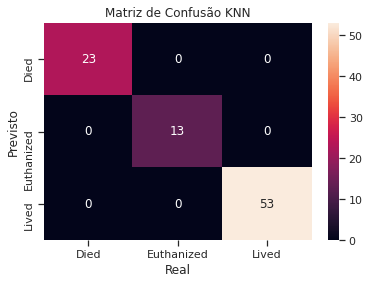

In [42]:
knn_tuned_parameters = [
    {
        'n_neighbors': range(5,10),
        'metric': [ 'minkowski', 'euclidean', 'manhattan', 'chebyshev' ],
        'weights': [ 'uniform', 'distance'],
    }
]

modelo_knn = GridSearchCV(KNeighborsClassifier(), knn_tuned_parameters, scoring='f1_micro', n_jobs=8)
modelo_knn.fit(preprocessaKNN(feats_treino), labels_treino)

print('Parâmetros do modelo: ', modelo_knn.best_params_)

avalia(preprocessaKNN(feats_teste), labels_teste, modelo_knn, titulo="KNN")